In [1]:
import os
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
#plt.style.use("fivethirtyeight")
#plt.style.use("Solarize_Light2")

seed = 100

In [2]:
pairwise_csv = 'annotated.csv'

In [3]:
df = pd.read_csv(pairwise_csv, index_col=0)

In [4]:
df.head(10)

,tweet_num,tweet_type,post_link,name,pred_protest,pred_violence
0,0,tweet,http://twitter.com/mzphoto_org/statuses/882641...,https___pbs.twimg.com_media_DD_GFQsW0AAZy5-.jpg,0.023730,0.409450
1,0,tweet,http://twitter.com/mzphoto_org/statuses/882641...,https___pbs.twimg.com_media_DD_GFQlWAAAkCdj.jpg,0.204886,0.316682
2,0,tweet,http://twitter.com/mzphoto_org/statuses/882641...,https___pbs.twimg.com_media_DD_GFQpW0AIms1Z.jpg,0.926072,0.357391
3,0,tweet,http://twitter.com/mzphoto_org/statuses/882641...,https___pbs.twimg.com_media_DD_GFQnW0AAaB37.jpg,0.896363,0.491737
4,1,tweet,http://twitter.com/bluebubble/statuses/8826403...,https___pbs.twimg.com_media_DD_ErPrXgAA0iz9.jpg,0.459497,0.411338
5,2,tweet,http://twitter.com/fhainarchy/statuses/8826413...,https___pbs.twimg.com_media_DD_Fmz9XYAEHpTF.jpg,0.230399,0.300966
6,3,tweet,http://twitter.com/tamara_pauli/statuses/88264...,https___pbs.twimg.com_media_DD_DvGZXsAAvQ_4.jpg,0.962765,0.431253
7,4,tweet,http://twitter.com/RobDotHutton/statuses/88264...,https___pbs.twimg.com_media_DD-0MSOXgAALFqB.jpg,0.010003,0.117162
8,5,tweet,http://twitter.com/Soltrumbo/statuses/88264146...,https___pbs.twimg.com_media_DD_FexaW0AA8iMY.jpg,0.512230,0.462322
9,5,tweet,http://twitter.com/Soltrumbo/statuses/88264146...,https___pbs.twimg.com_media_DD_Fh4UXoAAngGF.jpg,0.505160,0.212366


In [5]:
print("_" * 80)
print("%s number or rows in total" % len(df))

image_ids = len(set(df["name"]))
post_ids = len(set(df["post_link"]))

print("%s number of distinct images" % image_ids)
print("%s number of distinct tweets" % post_ids)

# any duplicates where image name and post link are the same?
pairs = {}
duplicates = {}
for _, i in df.iterrows():
    key = i.post_link + i["name"]
    if key in pairs:
        duplicates[i.post_link] = True
        continue
    pairs[key] = i

print("%s duplicate rows, from %s different tweets" % (len(df) - len(pairs), len(duplicates)))
print("_" * 80)

________________________________________________________________________________
46837 number or rows in total
24634 number of distinct images
38156 number of distinct tweets
149 duplicate rows, from 119 different tweets
________________________________________________________________________________


In [6]:
## Despite some tweets linking to the same images, all images should have the same
## Violence score assigned by the model, and the same protest classification:
imgs = {}
for _, i in df.iterrows():
    key = i["name"]
    if key in imgs:
        assert imgs[key].pred_violence == i.pred_violence, "Pred violence should be equal for equal images"
        assert imgs[key].pred_protest == i.pred_protest, "Pred protest should be equal for equal images"
    
    imgs[i["name"]] = i


In [7]:
# Filter out duplicate images before plotting scores
uniques = pd.DataFrame.from_dict(imgs, orient="index")

#  The plot over the distribution of violence scores for the images
The distribution looks very similar to the distribution of scores
obtained through mechanical turk over the ~11 000 images (protest related) 
used for training the model.

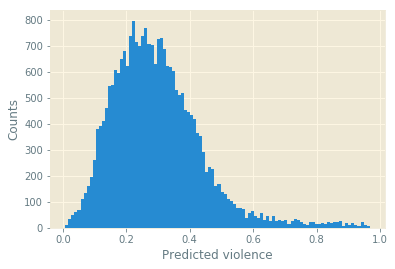

In [8]:
plt.hist(uniques["pred_violence"], 100)
plt.xlabel("Predicted violence")
plt.ylabel("Counts")
plt.show()

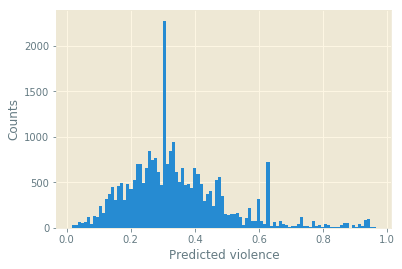

In [9]:
# Plotting only images that are duplicated, to see where they reside in terms of violence:
tmp = df.name.value_counts()
dupl = df[df.name.isin(tmp[tmp > 1].index.tolist())]

plt.hist(dupl["pred_violence"], 100)
plt.xlabel("Predicted violence")
plt.ylabel("Counts")
plt.show()

In [10]:
# Filter out video thumbnails:
no_thumbs = uniques[uniques.apply(lambda x: not "tw_video_thumb" in x["name"], axis=1)]
no_thumbs.head(3)

,tweet_num,tweet_type,post_link,name,pred_protest,pred_violence
https___pbs.twimg.com_amplify_video_thumb_881208218797658112_img_E7mzGWvwkdGP2zza.jpg,8579,tweet,http://twitter.com/bpol_nord/statuses/88286365...,https___pbs.twimg.com_amplify_video_thumb_8812...,0.008553,0.329666
https___pbs.twimg.com_amplify_video_thumb_882514916678266880_img__nAoeYQHuYp4GzVS.jpg,5448,tweet,http://twitter.com/furst_barbara/statuses/8825...,https___pbs.twimg.com_amplify_video_thumb_8825...,0.010083,0.404684
https___pbs.twimg.com_amplify_video_thumb_882549243394760704_img_nyN6Fxm6ss_cCiSs.jpg,4943,tweet,http://twitter.com/linkspazi/statuses/88255044...,https___pbs.twimg.com_amplify_video_thumb_8825...,0.086131,0.324742


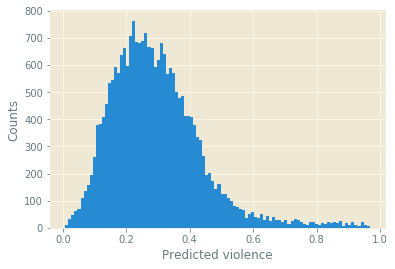

In [11]:
# plotting non video thumbnails:
plt.hist(no_thumbs["pred_violence"], 100)
plt.xlabel("Predicted violence")
plt.ylabel("Counts")
plt.show()

In [12]:
# Filter only for video thumbnails:
only_thumbs = uniques[uniques.apply(lambda x: "tw_video_thumb" in x["name"], axis=1)]
only_thumbs.head(3)

,tweet_num,tweet_type,post_link,name,pred_protest,pred_violence
https___pbs.twimg.com_ext_tw_video_thumb_642721245226778624_pu_img_iNFNJ9Ut3JX17O8E.jpg,85274,tweet,http://twitter.com/riedel_90/statuses/88339483...,https___pbs.twimg.com_ext_tw_video_thumb_64272...,0.046972,0.225435
https___pbs.twimg.com_ext_tw_video_thumb_693459267169468416_pu_img_Ytmic5sE-o899VhL.jpg,93675,tweet,http://twitter.com/sevdaakd/statuses/883428208...,https___pbs.twimg.com_ext_tw_video_thumb_69345...,0.671445,0.256360
https___pbs.twimg.com_ext_tw_video_thumb_697144711337918464_pu_img_hD8flsO1n9hBCg3x.jpg,36463,tweet,http://twitter.com/ThorstenGNMS/statuses/88308...,https___pbs.twimg.com_ext_tw_video_thumb_69714...,0.155577,0.474957


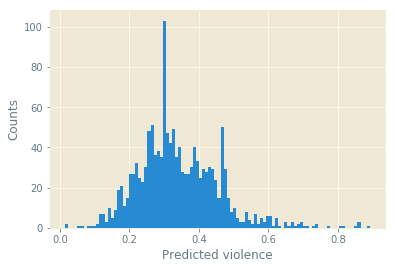

In [13]:
plt.hist(only_thumbs["pred_violence"], 100)
plt.xlabel("Predicted violence")
plt.ylabel("Counts")
plt.show()

In [14]:
# Number of video thumbnail images vs rest:
print("%s video thumbnail images (%.2f%%)" % (
    len(only_thumbs),
    len(only_thumbs)/len(uniques) * 100
))

1368 video thumbnail images (5.55%)


# Plots of protest related vs non-protest
The plot shows that the model classifies less than 5000 images as protest related out of ~25000 images.

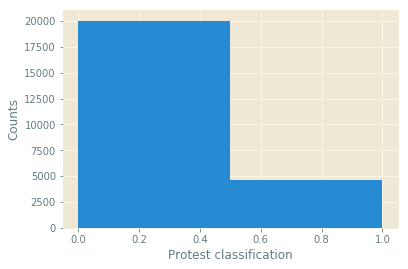

In [15]:
# The plot will automatically threshold at .5 since we're
# telling matplotlib to only create 2 bins of the values
# that are all in the range [0, 1]:
plt.hist(uniques["pred_protest"], 2)
plt.xlabel("Protest classification")
plt.ylabel("Counts")
plt.show()

## Plot protest related as function of threshold

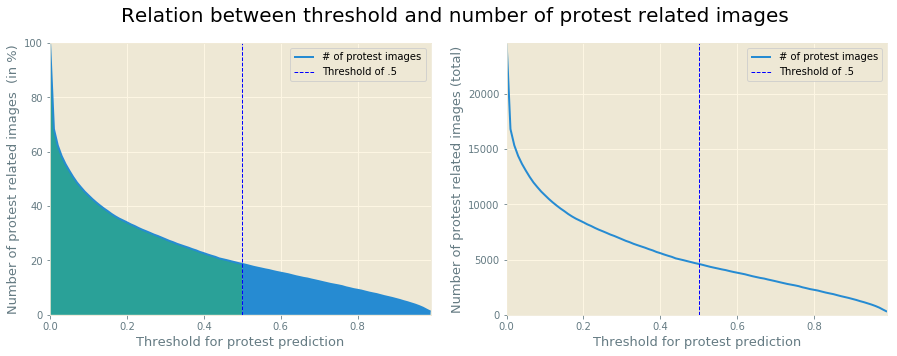

In [16]:
ys_1 = [] # in Percent
ys_2 = [] # in absolute

xs = range(100) # range doesnt like floats
for x in xs:
    # we divide by 100 to fit the range of scores in [0, 1]
    # and achieve a step size of .01 for every y
    ys_1.append(
        sum(
            uniques["pred_protest"] > (x/100)
        ) / len(uniques) * 100
    )
    ys_2.append(
        sum(
            uniques["pred_protest"] > (x/100)
        )
    )
xs = [x/100 for x in xs]
fontsize_axises = 13
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle("Relation between threshold and number of protest related images", fontsize=20)

acc1, = ax1.plot(xs, ys_1)
t1 = ax1.axvline(.5, linestyle="--", color="b", linewidth=1)
# Area above threshold:
zipped = list(zip(xs, ys_1))
above_t = np.array(list(filter(lambda i: i[0] >= .5, zipped)))
area_above = ax1.fill_between(
    above_t[:,0],
    above_t[:,1],
    where=above_t[:,1]>np.zeros(len(above_t)),
    interpolate=True
)
# Area below threshold:
below_t = np.array(list(filter(lambda i: i[0] <= .5, zipped)))
area_below = ax1.fill_between(
    below_t[:,0],
    below_t[:,1],
    where=below_t[:,1]>np.zeros(len(below_t)),
    interpolate=True,
)

ax1.legend(
    handles=[
        acc1,
        t1,
        #area_below,
        #area_above
    ],
    labels=[
        "# of protest images",
        "Threshold of .5",
        #"Area below threshold",
        #"Area above threshold"
    ]
)

ax1.set_xlabel("Threshold for protest prediction", fontsize=fontsize_axises)
ax1.set_ylabel("Number of protest related images  (in %)", fontsize=fontsize_axises)
ax1.set_ylim(0, 100)
ax1.set_xlim(0, max(xs))

acc2, = ax2.plot(xs, ys_2)
t2 = ax2.axvline(.5, linestyle="--", color="b", linewidth=1)
ax2.legend(handles=[acc2, t2], labels=["# of protest images", "Threshold of .5"])
ax2.set_xlabel("Threshold for protest prediction", fontsize=fontsize_axises)
ax2.set_ylabel("Number of protest related images (total)", fontsize=fontsize_axises)
ax2.set_ylim(0, len(uniques))
ax2.set_xlim(0, max(xs))
plt.show()

In [17]:
# The number of protest related images according to the model
# with a threshold of .5:
protest_related = len(uniques[uniques.pred_protest > .5])
print("%s protest related images of %s (%.2f%%)" % (
    protest_related,
    len(uniques),
    protest_related/len(uniques) * 100
))

4610 protest related images of 24634 (18.71%)


# Inspecting least and most violent images

________________________________________________________________________________
The 4 images from set of highest violence scores


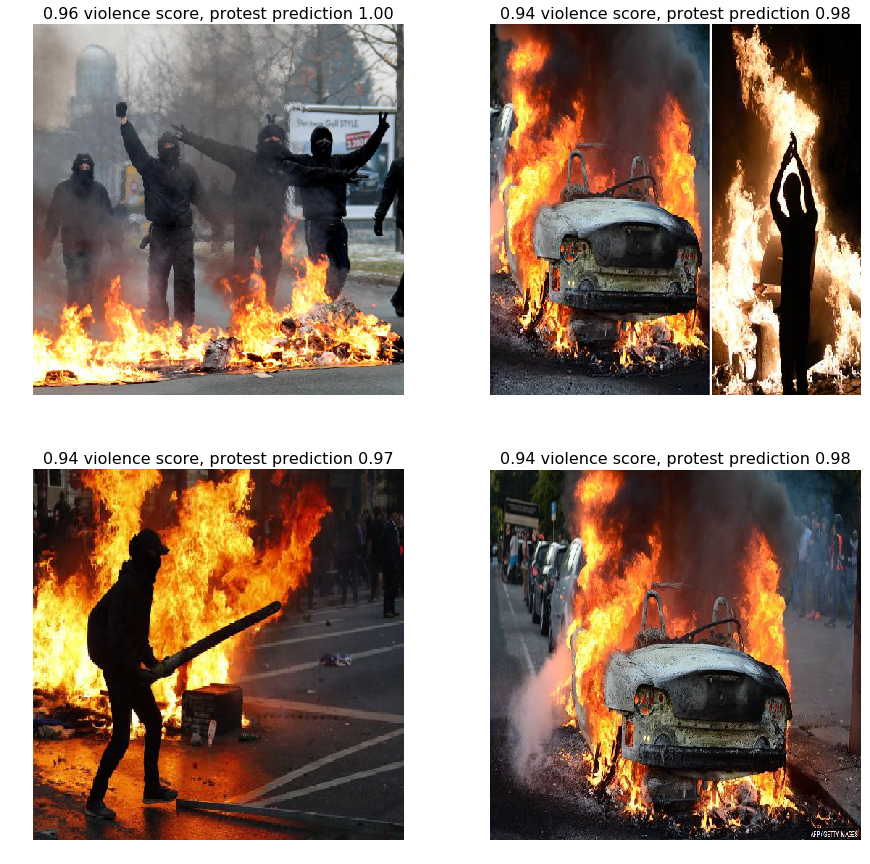

________________________________________________________________________________
The 4 images from set of smallest violence scores


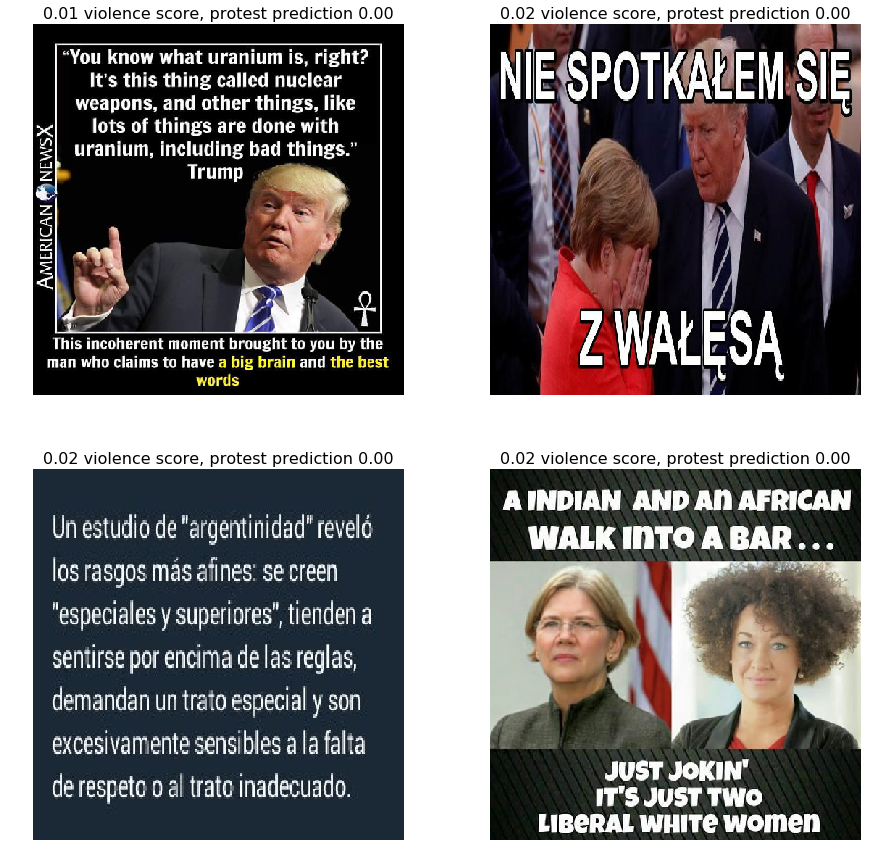

In [18]:
# show most violents images
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

most_violent = uniques.sort_values(
    by="pred_violence", ascending=False
).head(50).sample(4, random_state=seed) # Take 4 random from the 50 highest rated

print("_" * 80)
print("The 4 images from set of highest violence scores")
for i, ax in enumerate(axes.flat):
    row = most_violent.iloc[i]
    #print(row["name"])
    imgpath = os.path.join("dumps", row["name"])
    img = Image.open(imgpath).resize((512, 512))
    ax.axis("off")
    ax.set_title("%.2f violence score, protest prediction %.2f" % (
        row["pred_violence"],
        row["pred_protest"]
    ))
    ax.imshow(img)
plt.show()

least_violent = uniques.sort_values(
    by="pred_violence", ascending=True
).head(50).sample(4, random_state=seed) # Take 4 randomly from the 50 least rated


fig, axes = plt.subplots(2, 2, figsize=(15, 15))

print("_" * 80)
print("The 4 images from set of smallest violence scores")
for i, ax, in enumerate(axes.flat):
    row = least_violent.iloc[i]
    imgpath = os.path.join("dumps", row["name"])
    img = Image.open(imgpath).resize((512, 512))
    ax.axis("off")
    ax.set_title("%.2f violence score, protest prediction %.2f" % (
        row["pred_violence"],
        row["pred_protest"]
    ))
    ax.imshow(img)
plt.show()


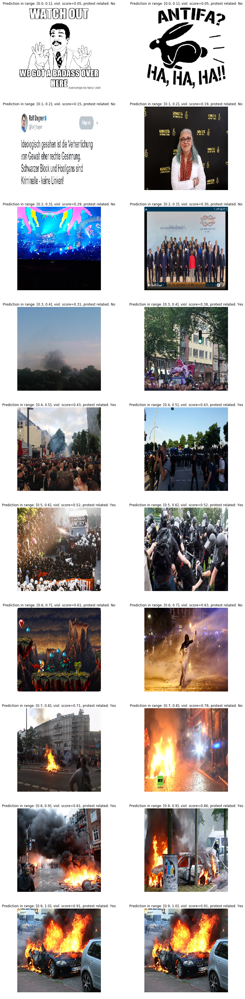

In [19]:
### Defining a set of intervals at a step size of .1 
### with the violence scores in the range from 0 to 1
### Then displays 2 sample images per interval with their
### predicted violence score, as well as whether they are
### protest related or not (thresholded at .5 or 50%)
fig, axes = plt.subplots(10, 2, figsize=(15, 65))

for i, ax, in enumerate(axes.flat):
    if i % 2 == 0:
        interval_start = i/20
        interval_end = interval_start + .1
        # sample from current interval set:
        sample = uniques[
            (uniques.pred_violence >= interval_start) &
            (uniques.pred_violence < interval_end)
        ].sample(2, random_state=seed).sort_values(by="pred_violence")
        
    imgpath = os.path.join("dumps", sample.iloc[i % 2].name)
    img = Image.open(imgpath).resize((512, 512))
    ax.axis("off")
    ax.set_title("Prediction in range: [%.1f, %.1f], viol. score=%.2f, protest related: %s" %
        (
            interval_start,
            interval_end,
            sample.iloc[i % 2].pred_violence,
            "Yes" if sample.iloc[i % 2].pred_protest > .5 else "No",
        ),
        fontsize=12
    )
    ax.imshow(img)
plt.show()


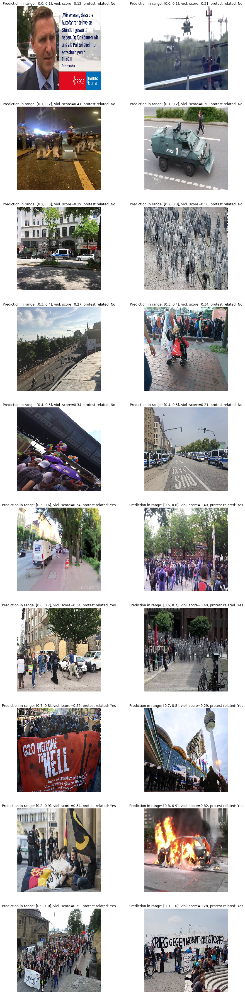

In [20]:
### Doing the same but for protest related images, seeing if there's
### an increase in action as the model is more certain that a given
### image is protest related:
fig, axes = plt.subplots(10, 2, figsize=(15, 65))

for i, ax, in enumerate(axes.flat):
    if i % 2 == 0:
        interval_start = i/20
        interval_end = interval_start + .1
        # sample from current interval set:
        sample = uniques[
            (uniques.pred_protest >= interval_start) &
            (uniques.pred_protest < interval_end)
        ].sample(2, random_state=seed).sort_values(by="pred_protest")
        
    imgpath = os.path.join("dumps", sample.iloc[i % 2].name)
    img = Image.open(imgpath).resize((512, 512))
    ax.axis("off")
    ax.set_title("Prediction in range: [%.1f, %.1f], viol. score=%.2f, protest related: %s" %
        (
            interval_start,
            interval_end,
            sample.iloc[i % 2].pred_violence,
            "Yes" if sample.iloc[i % 2].pred_protest > .5 else "No",
        ),
        fontsize=12
    )
    ax.imshow(img)
plt.show()

---------------------------------------------------
# Duplicated
For the `post_link` entries that are duplicated: checking whether they were already duplicated in the input dataset.

In [21]:
orig = pd.read_csv("data/Complete_dataset/combined.csv")

# Check if any tweet links where duplicated:
print(
    "%s duplicated `post_link`" % len(
        orig[orig.duplicated("post_link")]
    )
)

0 duplicated `post_link`


________________________________________________________________________________
149 duplicated pairs of `post_link` and image `name` in scraped dataset
________________________________________________________________________________
sample link:  http://twitter.com/Preiselbauer/statuses/883369346545876995
Showing linked images:


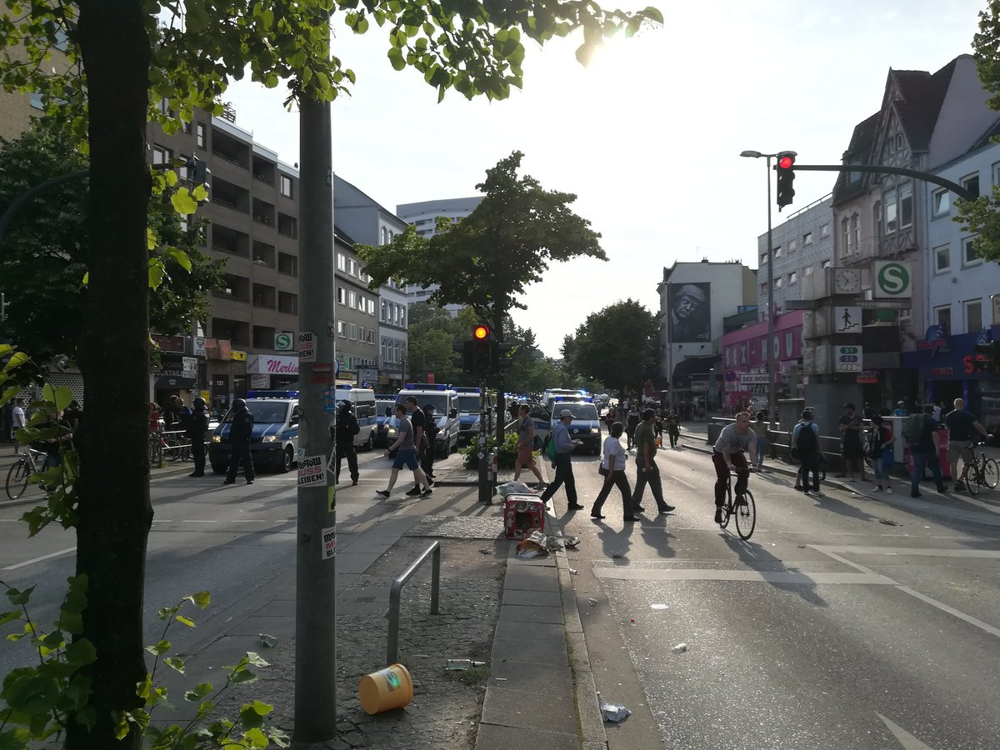

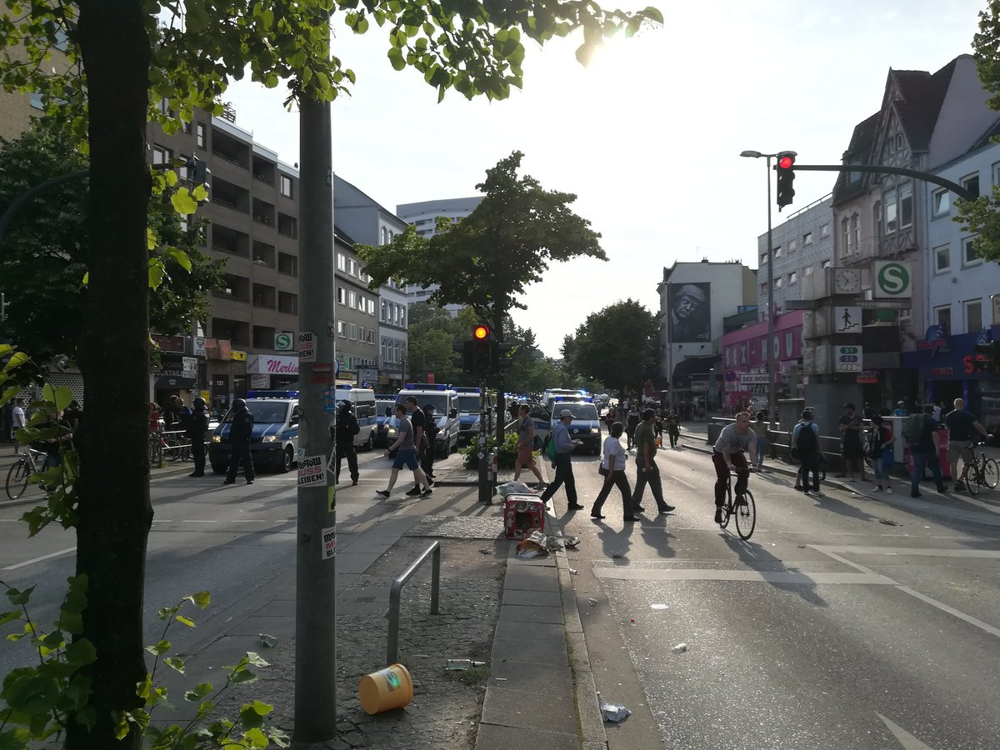

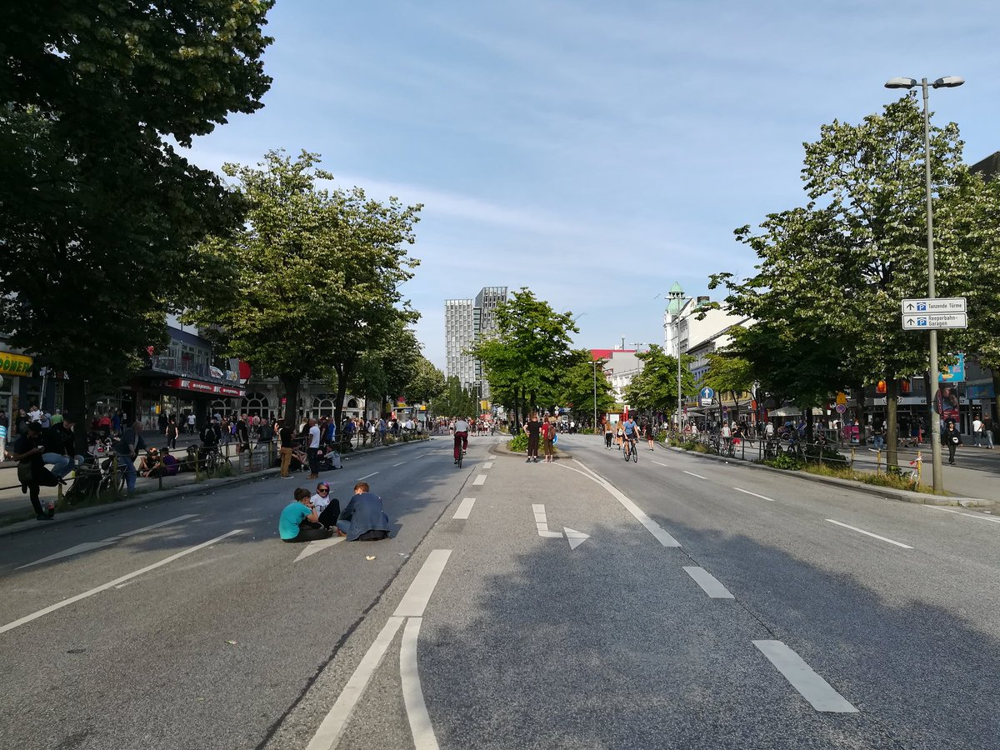

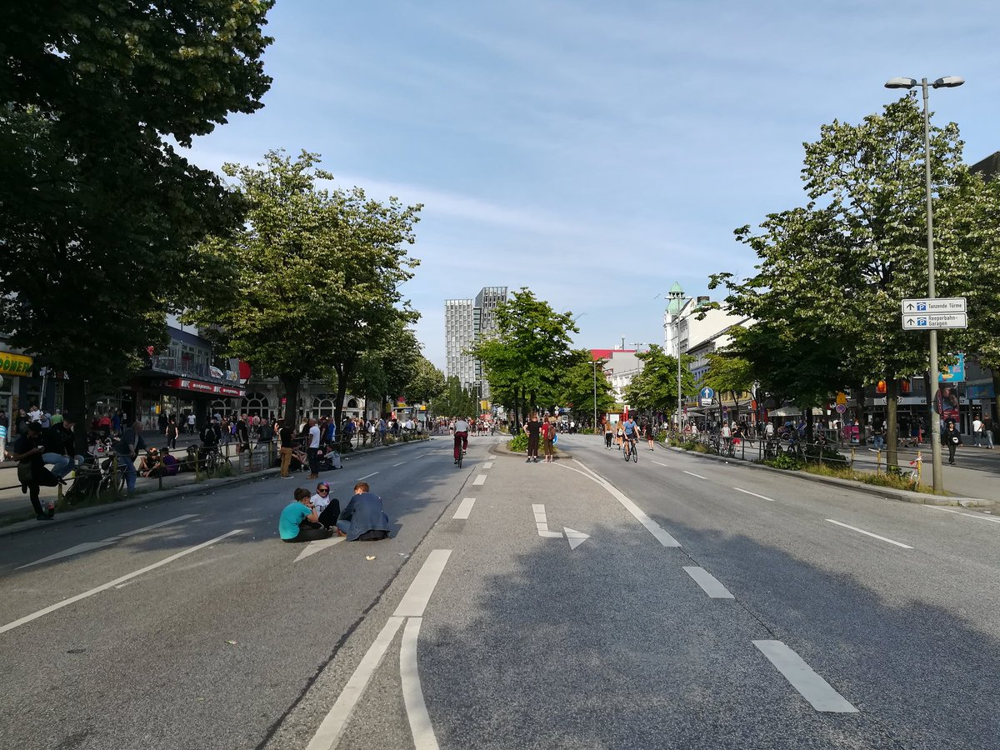

In [22]:
# In the scraped dataset, any post link may legitimately be duplicated
# for as many images that were linked to in that particular tweet.
# However, desirably the pair of `post_link` and image `name` should be unique in the dataset:
duplicate_pairs = df[df.duplicated(["post_link", "name"])]
print("_" * 80)
print("%s duplicated pairs of `post_link` and image `name` in scraped dataset" % len(duplicate_pairs))
print("_" * 80)

# sample link, for manual inspection:
sample = duplicate_pairs.sample(1, random_state=seed)
print("sample link: ", sample.post_link.values[0])
print("Showing linked images:")

## Display the images found on this link:
from IPython.display import display, Image as IPythonImage
for i in df[df["post_link"].isin(sample.post_link)].name.sort_values():
    display(IPythonImage(filename=os.path.join("dumps", i), width=512, height=512))

# Investigating 46 000 rows > the 25 000 images
That is, there must be a number of original tweets that linked to the same images.

In [34]:
# Get rows with images `names` that are represented more than once:
duplicates = df[df.duplicated("name")]

# remove the rows that are included in the duplicated pairs (which are clearly undesired):
duplicates = duplicates[~duplicates.isin(duplicate_pairs)]
len(duplicates)

22203

http://twitter.com/BrieftraegerBot/statuses/882999104791609344
http://twitter.com/PostelGert/statuses/882999101272600579
http://twitter.com/LIEBENHAlDER/statuses/883000267809202179
http://twitter.com/marcelinho/statuses/883016682746368001
http://twitter.com/Topfritte/statuses/883058207446507522
http://twitter.com/tpequeno/statuses/883108478725877761


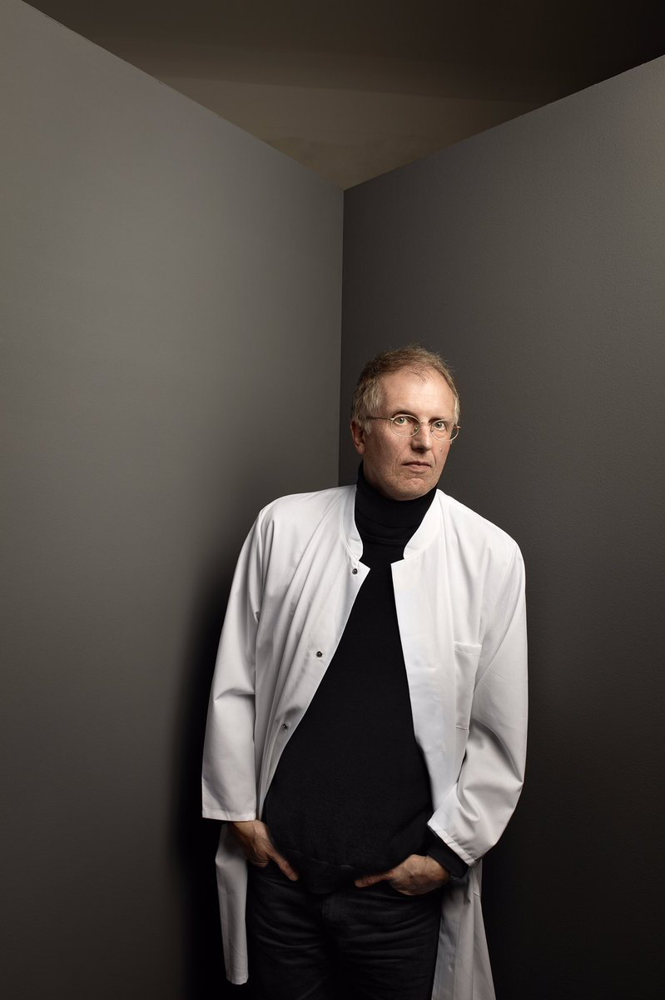

In [51]:
# Let's look at some tweets that seemingly includes the same image:
sample = duplicates.sample(1, random_state=seed)
tweets = df[df.name == sample.name.values[0]]
for _, i in tweets.iterrows():
    print(i.post_link)
    
# show the duplicated image:
Image.open(os.path.join("dumps", sample.name.values[0]))